# Comparação demanda x oferta x gênero/idade — Tarifa Zero (domingos + 4 meses)

Notebook self-contained: consome diretamente as bases de `01_criacao_de_bases/` (não depende de
`02_cria_base_demanda_mes.ipynb`). Cruza demanda por zona/gênero/faixa etária com oferta de frota,
isolando o efeito Tarifa Zero (domingo) usando dia útil como controle.

Fontes brutas em `C:\Users\9837292\Desktop\SSD\SPTrans\...` (consolidadas nesta máquina a partir das antigas unidades `E:\`/`F:\`).

## Seção 0 — imports e configuração

In [1]:
import os
import polars as pl
import pandas as pd
import geopandas as gpd
import numpy as np
import duckdb
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
from shapely.geometry import Point

In [2]:
# Raiz das fontes brutas (fora do repo). Se a unidade mudar, muda so esta linha.
RAIZ_SPTRANS = r"C:\Users\9837292\Desktop\SSD\SPTrans"

od = 2023  # 2023 ou 2017 — mesmo toggle usado em compara_demanda.ipynb
MESES = ["04", "05", "09", "10"]  # janela comum às duas bases (decisão já tomada com o usuário)

from pathlib import Path

DIR_IMG = Path("../docs/img")
DIR_TABELAS = Path("../outputs/03/tabelas")
DIR_IMG.mkdir(parents=True, exist_ok=True)
DIR_TABELAS.mkdir(parents=True, exist_ok=True)
SALVAR_FIG = dict(dpi=150, bbox_inches="tight", facecolor="white")

## Seção 1 — Agregado de demanda (linha × zona × Ano × Mês × tipo_dia × gênero × faixa etária)

- 4 Meses: deriva `tipo_dia` do weekday de `data`, filtra `MESES`, exclui domingo (não duplicar com a base de domingos).
- Domingos: filtra `MESES`, marca `tipo_dia="domingo"` (por construção, todas as linhas já são domingo).
- Agrega cada fonte separadamente e só então concatena (nunca concatenar linhas brutas antes de agregar).

**Motor:** `Dados_4Meses_2023_2024.parquet` tem ~11.8 GB / ~1.8 bilhões de linhas — um `scan_parquet`
lazy do Polars sobre esse volume travou a máquina numa tentativa anterior (CPU/IO saturados, sem
checkpoints). Trocado por uma única consulta SQL no DuckDB, que faz scan + filtro + agregação num motor
vetorizado, multi-thread, com gerenciamento de memória e *spill-to-disk* próprios — sem materializar as
1.8B linhas em objetos Python em nenhum momento. `PRAGMA threads` deixa 2 núcleos livres para o SO
continuar responsivo durante a agregação.

In [3]:
os.makedirs("../outputs/03", exist_ok=True)
OUTPUT_AGG = "../outputs/03/Dados_4Meses_Domingos_2023_2024_genero_idade.parquet"
FORCE_RECOMPUTE = False  # True para reprocessar do zero mesmo se o parquet de saída já existir

# Domingo NÃO vem mais da base crua: vem do agregado com zona imputada, produzido por
# 01_criacao_de_bases/05_imputa_zona_domingo.ipynb. Na base crua de domingos, zona_emb é 999
# em ~100% dos registros (ver achado abaixo).
DOMINGOS_IMPUTADO = "../outputs/01/Dados_Domingos_2023_2024_zona_imputada.parquet"

if not FORCE_RECOMPUTE and os.path.exists(OUTPUT_AGG):
    agg_demanda = pl.read_parquet(OUTPUT_AGG)
    print(f"Carregado do cache: {OUTPUT_AGG} ({len(agg_demanda)} linhas). "
          f"Defina FORCE_RECOMPUTE=True para reprocessar as bases brutas.")
else:
    con = duckdb.connect()
    con.execute(f"PRAGMA threads={max(1, (os.cpu_count() or 4) - 2)}")
    con.execute("PRAGMA memory_limit='32GB'")  # cinto de segurança, deixa RAM livre para o SO/outros apps

    meses_sql = ", ".join(f"'{m}'" for m in MESES)

    agg_demanda = con.sql(f"""
        WITH quatro_meses AS (
            SELECT
                linha_blt, zona_emb, genero, faixa_etaria,
                substr(data, 1, 4) AS Ano,
                substr(data, 5, 2) AS "Mês",
                CASE isodow(strptime(data, '%Y%m%d'))  -- 1=segunda ... 7=domingo
                    WHEN 6 THEN 'sabado'
                    WHEN 7 THEN 'domingo'
                    ELSE 'util'
                END AS tipo_dia
            FROM read_parquet('../outputs/01/Dados_4Meses_2023_2024.parquet')
            WHERE substr(data, 5, 2) IN ({meses_sql})
        ),
        domingos AS (
            -- ja agregado e com zona imputada; N_embarques e fracionario (alocacao proporcional)
            SELECT
                linha_blt, zona_emb, genero, faixa_etaria,
                substr(data, 1, 4) AS Ano,
                substr(data, 5, 2) AS "Mês",
                'domingo' AS tipo_dia,
                N_embarques
            FROM read_parquet('{DOMINGOS_IMPUTADO}')
            WHERE substr(data, 5, 2) IN ({meses_sql})
        )
        SELECT linha_blt, zona_emb, Ano, "Mês", tipo_dia, genero, faixa_etaria,
               COUNT(*)::DOUBLE AS N_embarques
        FROM quatro_meses
        WHERE tipo_dia != 'domingo'  -- domingo vem da base de domingos, não daqui
        GROUP BY 1, 2, 3, 4, 5, 6, 7

        UNION ALL

        SELECT linha_blt, zona_emb, Ano, "Mês", tipo_dia, genero, faixa_etaria,
               SUM(N_embarques) AS N_embarques
        FROM domingos
        GROUP BY 1, 2, 3, 4, 5, 6, 7
    """).pl()
    con.close()

    agg_demanda.write_parquet(OUTPUT_AGG)

agg_demanda

Carregado do cache: ../outputs/03/Dados_4Meses_Domingos_2023_2024_genero_idade.parquet (6059777 linhas). Defina FORCE_RECOMPUTE=True para reprocessar as bases brutas.


linha_blt,zona_emb,Ano,Mês,tipo_dia,genero,faixa_etaria,N_embarques
str,f64,str,str,str,str,str,f64
"""8615-10""",100.0,"""2023""","""04""","""util""","""M""","""40 a 49""",1908.0
"""5300-10""",56.0,"""2023""","""04""","""util""","""M""","""50 a 59""",168.0
"""475R-10""",57.0,"""2023""","""04""","""util""","""F""","""20 a 29""",768.0
"""8013-10""",100.0,"""2023""","""04""","""util""","""M""","""20 a 29""",6407.0
"""8400-10""",110.0,"""2023""","""04""","""util""","""M""","""20 a 29""",1714.0
…,…,…,…,…,…,…,…
"""N632-11""",289.0,"""2023""","""05""","""domingo""","""F""","""65 a 69""",1.0
"""273G-10""",192.0,"""2023""","""05""","""domingo""",null,"""20 a 29""",1.0
"""502J-10""",284.0,"""2023""","""05""","""domingo""","""F""","""50 a 59""",1.0


In [4]:
import re

# Dias efetivamente entregues por Ano x Mes x tipo_dia (fora daqui a entrega e desbalanceada
# entre os anos: 84 dias uteis entregues em 2023 contra 66 em 2024, 16 domingos contra 13).
# Somar N_embarques bruto por Ano x tipo_dia mede em parte o tamanho da entrega, nao a demanda
# -- por isso PctDiff/Sinal_tarifa_zero nas Secoes 3 e 6 usam `pivot_diario` abaixo, que tira a
# media diaria dentro de cada mes e so depois a media entre os 4 meses (mesmo procedimento da
# Secao 8, agora compartilhado por reaproveitar `n_dias` mais cedo no notebook).
PASTA_DOMINGOS = os.path.join(RAIZ_SPTRANS, "SEI! 5010.2026-0008307-9")
PASTA_4MESES = os.path.join(RAIZ_SPTRANS, "SEI! 5010.2026-0011927-8")


def datas_entregues(pasta):
    # Datas presentes numa entrega de bilhetagem, pelos nomes dos arquivos brutos.
    return {m.group(0) for f in os.listdir(pasta)
            if f.lower().endswith(".parquet") and (m := re.search(r"20\d{6}", f))}


def tipo_dia_de(d):
    w = pd.Timestamp(d).dayofweek
    return "sabado" if w == 5 else ("domingo" if w == 6 else "util")


# Cada tipo_dia so conta as datas da entrega de onde a Secao 1 tira aquele tipo (mesmo criterio
# usado la, para nao contar dias que a bilhetagem nao tem).
datas_bilhetagem = pd.DataFrame(
    [{"data": d, "tipo_dia": tipo_dia_de(d)}
     for pasta, tipos in [(PASTA_DOMINGOS, {"domingo"}), (PASTA_4MESES, {"util", "sabado"})]
     for d in datas_entregues(pasta)
     if tipo_dia_de(d) in tipos]
)
datas_bilhetagem["Ano"] = datas_bilhetagem["data"].str[:4]
datas_bilhetagem["Mes"] = datas_bilhetagem["data"].str[4:6]
datas_bilhetagem = datas_bilhetagem[datas_bilhetagem["Mes"].isin(MESES)
                                    & datas_bilhetagem["Ano"].isin(["2023", "2024"])]

n_dias = datas_bilhetagem.groupby(["Ano", "Mes", "tipo_dia"]).size().rename("n_dias")

print("dias entregues por ano x tipo_dia (base da normalizacao diaria):")
print(datas_bilhetagem.groupby(["Ano", "tipo_dia"])["data"].nunique().unstack().to_string())


def pivot_diario(df, group_cols):
    # Pivot Ano x tipo_dia por group_cols, com volume bruto (uso interno, so para limiares de
    # base minima como N_MIN_ZONA/N_MIN -- nunca exibir nem publicar, ver `dropar_bruto` abaixo)
    # e media diaria (para PctDiff/Sinal_tarifa_zero, as unicas colunas comparaveis entre anos)
    # -- media diaria dentro de cada mes, depois media entre os 4 meses, que neutraliza `n_dias`
    # desbalanceado.
    base = (df.group_by(group_cols + ["Ano", "Mês", "tipo_dia"]).agg(
                pl.col("N_embarques").sum().alias("N_embarques"))
              .to_pandas().rename(columns={"Mês": "Mes"}))

    bruto = (base.groupby(group_cols + ["Ano", "tipo_dia"])["N_embarques"].sum()
             .unstack(["tipo_dia", "Ano"]))
    bruto.columns = ["_".join(c) for c in bruto.columns]

    diario = base.merge(n_dias.reset_index(), on=["Ano", "Mes", "tipo_dia"], how="left")
    diario["embarques_dia"] = diario["N_embarques"] / diario["n_dias"]
    media = (diario.groupby(group_cols + ["Ano", "tipo_dia"])["embarques_dia"].mean()
             .unstack(["tipo_dia", "Ano"]))
    media.columns = ["dia_" + "_".join(c) for c in media.columns]

    p = bruto.join(media)
    for dia in ["domingo", "util"]:
        p[f"PctDiff_{dia}"] = (p[f"dia_{dia}_2024"] - p[f"dia_{dia}_2023"]) / p[f"dia_{dia}_2023"] * 100
    p["Sinal_tarifa_zero"] = p["PctDiff_domingo"] - p["PctDiff_util"]
    return p


def dropar_bruto(df):
    # Remove as colunas de total bruto acumulado no periodo (domingo_2023, util_2024, ...).
    # Regra do projeto: a quantidade de dias entregues difere entre 2023 e 2024, entao soma
    # bruta comparada entre anos mistura demanda real com tamanho da entrega -- so a media
    # diaria (colunas dia_*, PctDiff_*, Sinal_tarifa_zero) e comparavel. As colunas brutas so
    # devem existir como variavel interna, para cortes de base minima (N_MIN_ZONA, N_MIN,
    # N_MIN_ZONA_CORTE); nunca em DataFrame exibido, mapa ou tabela publicada.
    colunas_bruto = [c for c in df.columns if re.fullmatch(r"(domingo|util|sabado)_\d{4}", c)]
    return df.drop(columns=colunas_bruto)


dias entregues por ano x tipo_dia (base da normalizacao diaria):
tipo_dia  domingo  sabado  util
Ano                            
2023           16      17    84
2024           13      14    66


### `zona_emb` do domingo é imputada — o que isso permite e o que não permite

A entrega SEI de domingos (`SEI! 5010.2026-0008307-9`) traz `zona_emb` colapsado no código-sentinela
`999` (zona não classificada) em praticamente **100% dos registros**, nos dois anos — confirmado nos
arquivos brutos, não é bug de agregação deste notebook. A base de 4-meses não tem esse problema
(387 zonas distintas, distribuição plausível). Como domingo é exatamente o dia da Tarifa Zero, sem
correção não haveria análise por zona justamente onde a política age.

`01_criacao_de_bases/04_diagnostico_domingos_antiga_vs_nova.ipynb` mostrou que a entrega antiga
(`Pedido 097465`) é a **mesma população de eventos**, com registros replicados por um fator inteiro
que varia por classe de pagamento, e que ela **cobre 100% dos pares `(hash_anonimizado, linha_blt)`**
da entrega nova — com `zona_emb` real. `01_criacao_de_bases/05_imputa_zona_domingo.ipynb` usa isso
para **doar o atributo `zona_emb`** (nunca as contagens da base antiga): os embarques de cada par são
alocados proporcionalmente à distribuição de zonas do doador, o que preserva exatamente o volume da
base nova e não joga todo o peso numa única zona modal.

Cobertura medida: **~99% do volume que tem `linha_blt`**, ~74% do volume total (o resto são os ~25%
de registros sem linha, que pelo `04` não são embarque de ônibus municipal e saem de qualquer
contagem de demanda de todo modo). Cerca de 28% do volume imputado vem de pares com mais de uma
zona no doador — é aí que a alocação proporcional realmente estima em vez de copiar.

**Como ler os resultados por zona no domingo:** são estimativas em dois níveis. `zona_emb` já é uma
estimativa da própria SPTrans (GPS × endereço cadastrado × horário) mesmo quando vem original, e aqui
ela vem imputada por cima disso. Por isso as Seções 3, 5 e 6 mantêm a versão **por `linha_blt`** ao
lado da versão por zona: `linha_blt` é observado, não estimado, e serve de checagem de robustez.

In [5]:
# Cobertura da imputacao no recorte deste notebook. O denominador certo e o volume COM linha:
# registros sem linha_blt nao tem chave de imputacao e nao sao demanda de onibus municipal.
dom = agg_demanda.filter(pl.col("tipo_dia") == "domingo")
vol_com_linha = dom.filter(pl.col("linha_blt").is_not_null())["N_embarques"].sum()
vol_com_zona = dom.filter(pl.col("linha_blt").is_not_null()
                          & pl.col("zona_emb").is_not_null())["N_embarques"].sum()
cobertura = vol_com_zona / vol_com_linha

DOMINGO_ZONA_OK = cobertura >= 0.80

print(f"zonas distintas em domingo: {dom['zona_emb'].n_unique()}")
print(f"cobertura da zona no volume com linha: {100 * cobertura:.1f}%")
print(f"DOMINGO_ZONA_OK = {DOMINGO_ZONA_OK} (limiar 80%)")

zonas distintas em domingo: 356
cobertura da zona no volume com linha: 99.4%
DOMINGO_ZONA_OK = True (limiar 80%)


### Validação — proporção util/sábado/domingo (weekday) vs `Tipo Dia` de `Partidas.csv`

`Partidas.csv` é mais autoritativo para o vocabulário de tipo de dia. Comparamos as proporções de
embarques por `tipo_dia` (derivado do weekday) contra as proporções de partidas por `Tipo Dia`
(coluna original) para linhas/meses em comum. **Checar os valores exatos de `Tipo Dia` antes de
mapear** — não assumir os rótulos. `partidas_diag` (DuckDB) é carregado uma única vez aqui e reusado
na Seção 4 — evita reler o CSV de 467 MB / ~13M linhas duas vezes.

In [6]:
# Lido uma única vez via DuckDB (mais rápido que pandas.read_csv para ~13M linhas) e reusado na Seção 4
CAMINHO_PARTIDAS = os.path.join(RAIZ_SPTRANS, "pedido 096412- oferta", "Partidas.csv")

partidas_diag = duckdb.sql(f"""
    SELECT "Ano Mês", "Tipo Dia", "Linha"
    FROM read_csv('{CAMINHO_PARTIDAS.replace(chr(92), '/')}')
""").df()
print(partidas_diag["Tipo Dia"].unique())  # confirmar rótulos exatos antes de mapear

<ArrowStringArray>
['UTIL', 'SABD', 'DOMG']
Length: 3, dtype: str


In [7]:
# Mapear rótulos de Tipo Dia (Partidas) para o vocabulário tipo_dia da Seção 1
# Confirmado em <RAIZ_SPTRANS>\pedido 096412- oferta\Descrição dos Campos e-sic 96412.txt:
# UTIL (dias úteis), SABD (sábados), DOMG (domingos)
MAPA_TIPO_DIA_PARTIDAS = {
    "UTIL": "util",
    "SABD": "sabado",
    "DOMG": "domingo",
}
nao_mapeados = set(partidas_diag["Tipo Dia"].unique()) - set(MAPA_TIPO_DIA_PARTIDAS)
if nao_mapeados:
    print("Valores de Tipo Dia sem mapeamento:", nao_mapeados)

partidas_diag["tipo_dia"] = partidas_diag["Tipo Dia"].map(MAPA_TIPO_DIA_PARTIDAS)
partidas_diag["Ano"] = partidas_diag["Ano Mês"].astype(str).str[:4]
partidas_diag["Mês"] = partidas_diag["Ano Mês"].astype(str).str[-2:]
partidas_diag = partidas_diag.loc[partidas_diag["Mês"].isin(MESES)]

prop_partidas = partidas_diag.value_counts(["Ano", "Mês", "tipo_dia"], normalize=False)
prop_partidas = prop_partidas / partidas_diag.groupby(["Ano", "Mês"]).size()

prop_demanda = (
    agg_demanda.to_pandas()
    .groupby(["Ano", "Mês", "tipo_dia"])["N_embarques"].sum()
)
prop_demanda = prop_demanda / prop_demanda.groupby(["Ano", "Mês"]).transform("sum")

comparacao = pd.DataFrame({"prop_demanda": prop_demanda, "prop_partidas": prop_partidas}).dropna()
comparacao["diff_abs"] = (comparacao["prop_demanda"] - comparacao["prop_partidas"]).abs()
print(comparacao)
if (comparacao["diff_abs"] > 0.05).any():
    print("AVISO: divergência > 5% entre proporção de tipo_dia (weekday) e Tipo Dia (Partidas) em algum Ano/Mês.")
    print("Nota: prop_demanda (share de embarques) e prop_partidas (share de partidas programadas) "
          "medem coisas diferentes e não têm por que coincidir em valor absoluto — mais gente embarca "
          "em dia útil por linha do que em domingo, mesmo com número de partidas comparável entre tipos "
          "de dia. Esta célula é um sanity check direcional (a ordem util > sábado > domingo bate em "
          "ambos), não uma prova de que o tipo_dia derivado do weekday está certo.")

                   prop_demanda  prop_partidas  diff_abs
Ano  Mês tipo_dia                                       
2023 04  domingo       0.057565       0.233074  0.175509
         sabado        0.127198       0.308973  0.181775
         util          0.815237       0.457952  0.357284
     05  domingo       0.038408       0.233178  0.194770
         sabado        0.072255       0.308916  0.236661
         util          0.889337       0.457906  0.431431
     09  domingo       0.052306       0.232682  0.180376
         sabado        0.120137       0.308748  0.188611
         util          0.827557       0.458570  0.368987
     10  domingo       0.054586       0.231943  0.177358
         sabado        0.092197       0.308597  0.216400
         util          0.853217       0.459459  0.393758
2024 04  domingo       0.055409       0.231224  0.175815
         sabado        0.075077       0.306393  0.231316
         util          0.869514       0.462383  0.407131
     05  domingo       0.067960

## Seção 2 — Geometria das zonas, ponto de referência do CBD e tiers de periferia

Reusa o toggle `od` e o shapefile de zonas de `compara_demanda.ipynb`. Ponto de referência: Praça da Sé.

In [8]:
if od == 2023:
    zonas = gpd.read_file(r"..\Dados\pacote-anexos-od_10-02-25_0\002_Site Metro Mapas\Shape\Zonas_2023.shp")
elif od == 2017:
    zonas = gpd.read_file(r"..\Dados\OD-2017\Mapas-OD2017\Shape-OD2017\Zonas_2017_region.shp")

print(zonas.crs)
zonas

EPSG:22523


,NumeroZona,NomeZona,NumeroMuni,NomeMunici,NumDistrit,NomeDistri,Area_ha_2,geometry
0,1,Sé,36,São Paulo,80,Sé,57.10,"POLYGON ((333739.415 7394619.838, 333792.438 7..."
1,2,Parque Dom Pedro,36,São Paulo,80,Sé,113.64,"POLYGON ((333106.146 7395425.48, 333120.09 739..."
2,3,Praça João Mendes,36,São Paulo,80,Sé,47.75,"POLYGON ((333353.211 7393933.156, 333238.044 7..."
3,4,Ladeira da Memória,36,São Paulo,67,República,75.11,"POLYGON ((332742.619 7394795.328, 332742.537 7..."
4,5,República,36,São Paulo,67,República,74.95,"POLYGON ((332983.962 7395262.578, 333004.239 7..."
...,...,...,...,...,...,...,...,...
522,523,Quatro Encruzilhadas,17,Itapevi,113,Itapevi,2101.43,"POLYGON ((300336.368 7389696.621, 300324.32 73..."
523,524,Itapevi,17,Itapevi,113,Itapevi,1070.03,"POLYGON ((303326.146 7397176.35, 303326.146 73..."
524,525,Amador Bueno,17,Itapevi,113,Itapevi,5113.23,"POLYGON ((303292.377 7397174.79, 303326.146 73..."
525,526,Santana de Parnaíba,31,Santana de Parnaíba,127,Santana de Parnaíba,18034.76,"POLYGON ((296271.998 7398946.927, 296196.397 7..."


In [9]:
cbd_wgs84 = gpd.GeoSeries([Point(-46.6333, -23.5505)], crs=4326)

if zonas.crs is None or zonas.crs.is_geographic:
    zonas = zonas.to_crs(22523)

cbd_proj = cbd_wgs84.to_crs(zonas.crs).iloc[0]

zonas["dist_cbd_km"] = zonas.geometry.centroid.distance(cbd_proj) / 1000
zonas["periferia_tier"] = pd.qcut(
    zonas["dist_cbd_km"], 4,
    labels=["Centro", "Intermediário 1", "Intermediário 2", "Periferia"],
)
zonas[["NumeroZona", "dist_cbd_km", "periferia_tier"]]

,NumeroZona,dist_cbd_km,periferia_tier
0,1,0.194387,Centro
1,2,0.791923,Centro
2,3,0.403557,Centro
3,4,0.874281,Centro
4,5,1.195083,Centro
...,...,...,...
522,523,36.750151,Periferia
523,524,29.976588,Periferia
524,525,34.003842,Periferia
525,526,31.048335,Periferia


                 count       mean
periferia_tier                   
Centro             132   4.607811
Intermediário 1    132  11.329736
Intermediário 2    131  18.093802
Periferia          132  34.002557


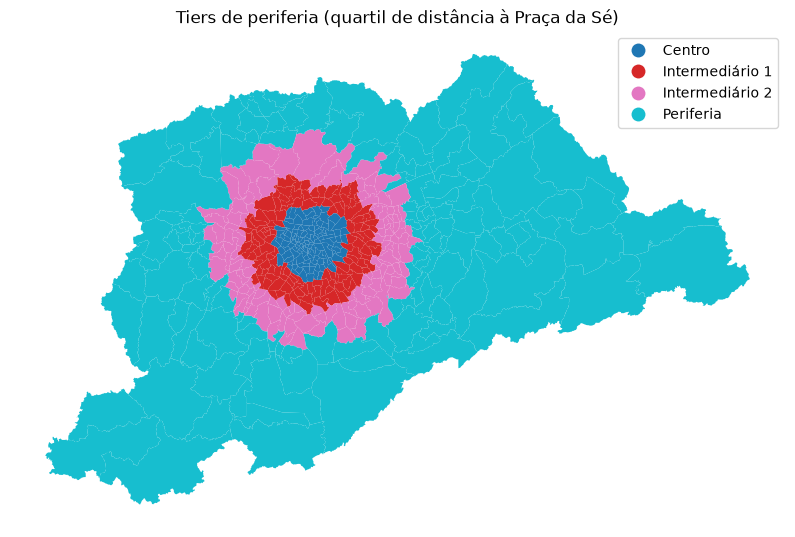

In [10]:
# Sanity check: contagem de zonas e distância média por tier
tiers_periferia = zonas.groupby("periferia_tier")["dist_cbd_km"].agg(count="count", dist_media_km="mean")
tiers_periferia.to_parquet(DIR_TABELAS / "tiers_periferia.parquet")

print(zonas.groupby("periferia_tier")["dist_cbd_km"].agg(["count", "mean"]))

fig, ax = plt.subplots(figsize=(10, 8))
zonas.plot(column="periferia_tier", categorical=True, legend=True, ax=ax)
ax.set_title("Tiers de periferia (quartil de distância à Praça da Sé)")
ax.set_axis_off()
plt.savefig(DIR_IMG / "tiers_periferia.png", **SALVAR_FIG)
plt.show()

## Seção 3 — Diffs de demanda, domingo vs útil, isolando o efeito Tarifa Zero

`Sinal_tarifa_zero = PctDiff_domingo - PctDiff_util` isola o efeito específico de domingo (Tarifa
Zero) do crescimento geral de demanda, que também aparece em dia útil. `PctDiff_domingo` e
`PctDiff_util` são calculados sobre a **média diária** (média dentro de cada mês, depois média
entre os 4 meses, via `pivot_diario` definido logo após a Seção 1), não sobre a soma bruta — a
entrega é desbalanceada entre os anos (84 dias úteis entregues em 2023 contra 66 em 2024, 16
domingos contra 13), e somar bruto mediria em parte o tamanho da entrega, não a demanda (mesma
armadilha documentada na Seção 8).

Com a imputação da Seção 1, **o resultado principal volta a ser por zona** — é ele que mostra onde
na cidade a política pegou. Logo em seguida vem a **mesma métrica por `linha_blt`**, que serve de
checagem de robustez: `linha_blt` é observado, `zona_emb` no domingo é imputado sobre uma variável
que já era estimada. Se os dois recortes contarem histórias diferentes, é a versão por linha que
manda.

Zonas com menos de `N_MIN_ZONA` embarques em domingo/2023 (volume bruto) saem dos mapas: uma base
pequena produz variação percentual enorme e sem significado.


zonas com dado: 355 | suprimidas por base < 500: 6


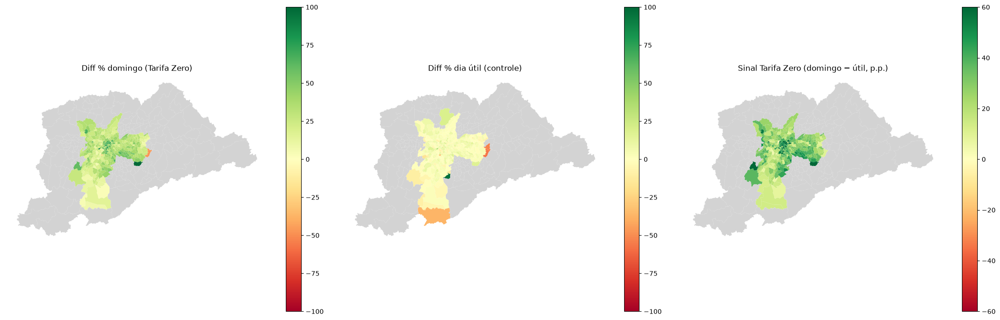

In [11]:
N_MIN_ZONA = 500   # base minima de domingo/2023 (volume bruto) para a variacao % da zona significar algo

zona_pivot = pivot_diario(
    agg_demanda.filter(pl.col("zona_emb").is_not_null() & pl.col("linha_blt").is_not_null()),
    ["zona_emb"],
)

# Base pequena em domingo/2023 -> variacao % sem significado; suprimida dos mapas.
esparsas = zona_pivot["domingo_2023"] < N_MIN_ZONA
zona_pivot.loc[esparsas, ["PctDiff_domingo", "Sinal_tarifa_zero"]] = np.nan
zona_pivot = dropar_bruto(zona_pivot).reset_index()

print(f"zonas com dado: {len(zona_pivot)} | suprimidas por base < {N_MIN_ZONA}: {esparsas.sum()}")

zonas_map = gpd.GeoDataFrame(
    zonas.merge(zona_pivot, left_on="NumeroZona", right_on="zona_emb", how="left"),
    geometry="geometry", crs=zonas.crs,
)

fig, axes = plt.subplots(1, 3, figsize=(22, 7))
painel = [
    ("PctDiff_domingo", "Diff % domingo (Tarifa Zero)", 100),
    ("PctDiff_util", "Diff % dia útil (controle)", 100),
    ("Sinal_tarifa_zero", "Sinal Tarifa Zero (domingo − útil, p.p.)", 60),
]
for ax, (col, titulo, lim) in zip(axes, painel):
    zonas_map.plot(column=col, cmap="RdYlGn", vmin=-lim, vmax=lim, legend=True,
                   missing_kwds={"color": "lightgrey"}, ax=ax)
    ax.set_title(titulo)
    ax.set_axis_off()
plt.tight_layout()
plt.savefig(DIR_IMG / "sinal_zona_3paineis.png", **SALVAR_FIG)
plt.show()


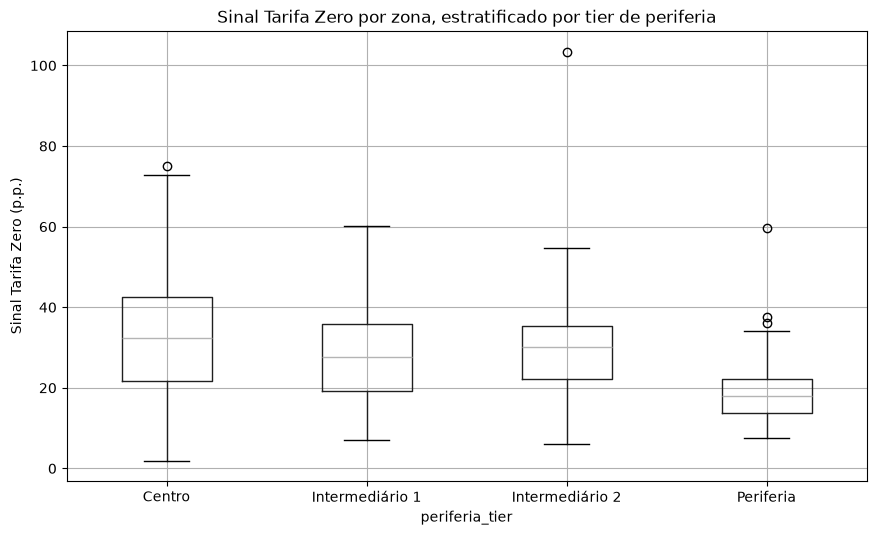

                 count  median  mean
periferia_tier                      
Centro             132    32.5  34.0
Intermediário 1    111    27.6  28.1
Intermediário 2     80    30.1  30.3
Periferia           26    17.9  20.4


In [12]:
# Mapa interativo do sinal isolado, por zona, e estratificacao por tier de periferia.
zonas_wgs = zonas_map.to_crs(4326)
lim = float(np.nanpercentile(np.abs(zonas_wgs["Sinal_tarifa_zero"]), 95))
escala = cm.LinearColormap(["#b2182b", "#f7f7f7", "#1a9850"], vmin=-lim, vmax=lim,
                           caption="Sinal Tarifa Zero (p.p.)")

def cor(v):
    if v is None or v != v:      # None ou NaN: zona sem dado / suprimida
        return "#d9d9d9"
    return escala(max(-lim, min(lim, v)))


mapa = folium.Map(location=[-23.5505, -46.6333], zoom_start=10, tiles="cartodbpositron")
folium.GeoJson(
    zonas_wgs[["NumeroZona", "Sinal_tarifa_zero", "PctDiff_domingo", "PctDiff_util",
               "periferia_tier", "geometry"]],
    style_function=lambda f: {
        "fillColor": cor(f["properties"]["Sinal_tarifa_zero"]),
        "color": "white", "weight": 0.4, "fillOpacity": 0.8,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["NumeroZona", "Sinal_tarifa_zero", "PctDiff_domingo", "PctDiff_util",
                "periferia_tier"],
        aliases=["Zona", "Sinal (p.p.)", "Diff % domingo", "Diff % útil", "Tier"],
        localize=True,
    ),
).add_to(mapa)
escala.add_to(mapa)
mapa.save("../docs/mapa_sinal_tarifa_zero_zona.html")   # publicado no GitHub Pages

zonas_tab = pd.DataFrame(zonas_map.drop(columns="geometry"))   # boxplot nao lida com geometria

fig, ax = plt.subplots(figsize=(10, 6))
zonas_tab.boxplot(column="Sinal_tarifa_zero", by="periferia_tier", ax=ax)
ax.set_title("Sinal Tarifa Zero por zona, estratificado por tier de periferia")
ax.set_ylabel("Sinal Tarifa Zero (p.p.)")
plt.suptitle("")
plt.savefig(DIR_IMG / "sinal_zona_boxplot_tier.png", **SALVAR_FIG)
plt.show()

print(zonas_tab.groupby("periferia_tier", observed=True)["Sinal_tarifa_zero"]
      .agg(["count", "median", "mean"]).round(1).to_string())

sinal_por_tier_zona = (
    zonas_tab.groupby("periferia_tier", observed=True)["Sinal_tarifa_zero"]
    .agg(count="count", mediana="median", media="mean")
)
sinal_por_tier_zona.to_parquet(DIR_TABELAS / "sinal_por_tier_zona.parquet")

mapa

In [13]:
# Mesma metrica por LINHA — checagem de robustez do resultado por zona acima.
# linha_blt e observado; zona_emb no domingo e imputado sobre uma variavel ja estimada.
linha_pivot = dropar_bruto(pivot_diario(
    agg_demanda.filter(pl.col("linha_blt").is_not_null()),
    ["linha_blt"],
)).reset_index()
linha_pivot


,linha_blt,dia_domingo_2023,dia_sabado_2023,dia_util_2023,dia_domingo_2024,dia_sabado_2024,dia_util_2024,PctDiff_domingo,PctDiff_util,Sinal_tarifa_zero
0,1012-10,2627.958333,4680.154167,5605.384991,3157.875000,4502.645833,5333.200758,20.164576,-4.855763,25.020340
1,1012-21,NaN,NaN,1251.975185,NaN,10.333333,2322.466540,NaN,85.504199,NaN
2,1014-10,NaN,NaN,NaN,NaN,1.500000,999.666667,NaN,NaN,NaN
3,1015-10,403.775000,760.112500,1364.097322,677.979167,955.458333,1720.288826,67.910140,26.111884,41.798256
4,1016-10,3669.558333,5933.629167,8038.567963,4454.708333,5590.000000,7775.082702,21.396308,-3.277764,24.674072
...,...,...,...,...,...,...,...,...,...,...
1321,N839-11,15.733333,16.462500,8.783576,17.187500,17.270833,8.562500,9.242585,-2.516925,11.759510
1322,N840-11,14.700000,18.454167,8.218832,24.291667,20.145833,11.674242,65.249433,42.042599,23.206834
1323,N841-11,10.550000,9.912500,5.970793,13.708333,13.708333,8.654040,29.936809,44.939558,-15.002749
1324,N842-11,99.650000,114.816667,82.276893,95.833333,135.062500,106.430240,-3.830072,29.356173,-33.186245


linhas com o mesmo tier em domingo e em dia util: 88.0% (1168 linhas comparadas)


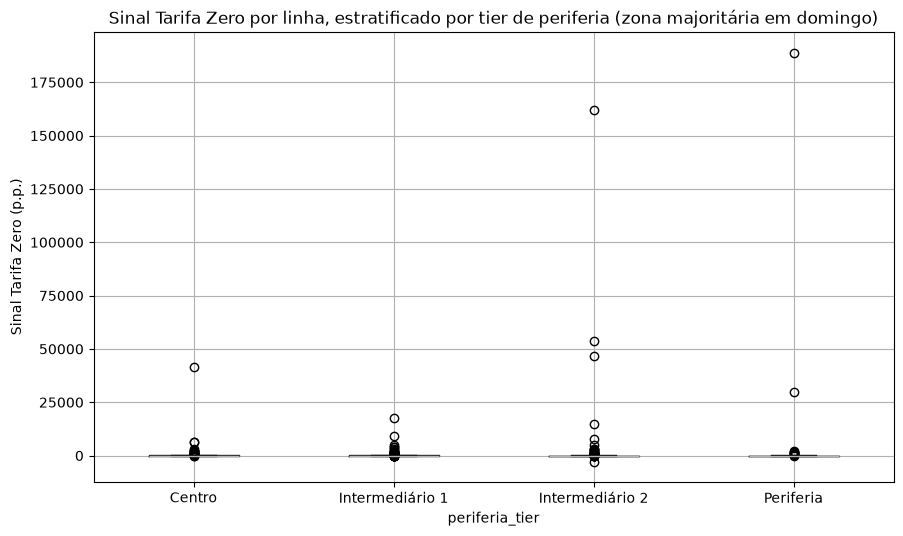

In [14]:
# Tier de periferia de cada linha: zona de embarque majoritaria da linha NO DOMINGO.
# Antes da imputacao isso tinha de ser aproximado pelo dia util; agora o domingo tem zona
# propria, entao o tier reflete o dia que interessa. `linha_periferia_util` fica ao lado
# para os paineis de controle e para medir o quanto a aproximacao antiga distorcia.
def tier_por_linha(dia):
    dominante = (
        agg_demanda
        .filter((pl.col("tipo_dia") == dia) & pl.col("zona_emb").is_not_null()
                & pl.col("linha_blt").is_not_null())
        .group_by(["linha_blt", "zona_emb"])
        .agg(pl.col("N_embarques").sum().alias("N_embarques"))
        .to_pandas()
        .sort_values("N_embarques", ascending=False)
        .drop_duplicates(subset="linha_blt", keep="first")[["linha_blt", "zona_emb"]]
    )
    return dominante.merge(
        zonas[["NumeroZona", "periferia_tier"]],
        left_on="zona_emb", right_on="NumeroZona", how="left",
    )[["linha_blt", "periferia_tier"]]


linha_periferia = tier_por_linha("domingo")
linha_periferia_util = tier_por_linha("util")

conf = linha_periferia.merge(linha_periferia_util, on="linha_blt", suffixes=("_dom", "_util"))
igual = (conf["periferia_tier_dom"] == conf["periferia_tier_util"]).mean()
print(f"linhas com o mesmo tier em domingo e em dia util: {100 * igual:.1f}% "
      f"({len(conf)} linhas comparadas)")

linha_pivot_tier = linha_pivot.merge(linha_periferia, on="linha_blt", how="left")

fig, ax = plt.subplots(figsize=(10, 6))
linha_pivot_tier.boxplot(column="Sinal_tarifa_zero", by="periferia_tier", ax=ax)
ax.set_title("Sinal Tarifa Zero por linha, estratificado por tier de periferia (zona majoritária em domingo)")
ax.set_ylabel("Sinal Tarifa Zero (p.p.)")
plt.suptitle("")
plt.savefig(DIR_IMG / "sinal_linha_boxplot_tier.png", **SALVAR_FIG)
plt.show()

In [15]:
# Zona x linha contam a mesma historia? Comparacao das medianas por tier — se divergirem
# muito, a leitura a privilegiar e a por linha (unidade observada).
comparacao_unidades = pd.concat([
    zonas_tab.groupby("periferia_tier", observed=True)["Sinal_tarifa_zero"].median().rename("por_zona"),
    linha_pivot_tier.groupby("periferia_tier", observed=True)["Sinal_tarifa_zero"].median().rename("por_linha"),
], axis=1)
comparacao_unidades["diferenca_pp"] = comparacao_unidades["por_zona"] - comparacao_unidades["por_linha"]
print("Sinal Tarifa Zero mediano por tier, nas duas unidades (p.p.):")
print(comparacao_unidades.round(1).to_string())
comparacao_unidades.to_parquet(DIR_TABELAS / "robustez_zona_vs_linha.parquet")

Sinal Tarifa Zero mediano por tier, nas duas unidades (p.p.):
                 por_zona  por_linha  diferenca_pp
periferia_tier                                    
Centro               32.5       26.9           5.5
Intermediário 1      27.6       27.3           0.3
Intermediário 2      30.1       25.4           4.7
Periferia            17.9       19.5          -1.7


## Seção 4 — Lado da oferta

`Partidas.csv` + `Tecnologias.csv` (`C:\Users\9837292\Desktop\SSD\SPTrans\pedido 096412- oferta\`, `encoding="utf-8"` —
**não** `latin-1`: o arquivo é UTF-8, `latin-1` produz mojibake nos nomes de tecnologia acentuados).

**Achado importante:** apesar de `Descrição dos Campos e-sic 96412.txt` documentar `Tipo Dia` em
`Tecnologias.csv` como podendo ser `UTIL`/`SABD`/`DOMG`, o arquivo entregue só contém linhas `UTIL`
(256593/256593). Ou seja, **a composição de frota por tecnologia só é conhecida para dia útil** — não
há como calcular `Frota × capacidade_nominal` diretamente para domingo/sábado. `Partidas.csv` (contagem
de partidas programadas), por outro lado, cobre os três tipos de dia. A solução adotada abaixo — uma
mudança em relação ao plano original, que previa capacidade de frota como proxy principal — é estimar a
capacidade ofertada por tipo de dia como `n_partidas(tipo_dia) × capacidade_média_do_veículo(linha, mês)`,
assumindo que a composição de frota por tecnologia de uma linha não varia por tipo de dia (só a
frequência varia) — premissa razoável mas não verificável com os dados disponíveis, e uma limitação a
mencionar em qualquer conclusão publicada.

**Capacidade nominal por categoria de tecnologia — valores públicos aproximados, a validar antes de
qualquer conclusão publicada.** Categorias observadas em `Tecnologias.csv` (após remover prefixo `"e"`
de variantes elétricas e sufixo numérico de tamanho — ex.: `Articulado18`, `eArticulado21` e
`Articulado23` caem todos em `"Articulado"`): `Miniônibus`, `Micro Ônibus`, `Midiônibus`,
`Midiônibus Rural`, `Básico`, `Padron`, `Articulado`. Os sufixos numéricos das variantes elétricas
**não coincidem** com os das variantes a combustão correspondentes (ex.: `eArticulado21/22` vs.
`Articulado18/19/20/23`) — por isso o agrupamento é por categoria, não por tamanho exato.
`Embarcacao*` (balsa/embarcação, não ônibus) é excluída.

In [16]:
import re

CAPACIDADE_POR_CATEGORIA = {
    "Miniônibus": 40,
    "Micro Ônibus": 30,
    "Midiônibus": 60,
    "Midiônibus Rural": 55,
    "Básico": 80,
    "Padron": 95,
    "Articulado": 150,
}

def categoria_base(tecnologia: str):
    """Normaliza 'eArticulado21' / 'Articulado18' -> 'Articulado' (remove prefixo 'e' e sufixo numérico)."""
    if tecnologia is None or tecnologia.startswith("Embarcacao"):
        return None
    s = tecnologia[1:] if tecnologia.startswith("e") else tecnologia
    return re.sub(r"\d+$", "", s).strip()

def capacidade_de(tecnologia: str):
    return CAPACIDADE_POR_CATEGORIA.get(categoria_base(tecnologia))

In [17]:
tecnologias = pd.read_csv(
    os.path.join(RAIZ_SPTRANS, "pedido 096412- oferta", "Tecnologias.csv"),
    encoding="utf-8",
)
print(tecnologias["Tipo Dia"].unique())  # esperado: só 'UTIL' (achado documentado acima)
tecnologias

<ArrowStringArray>
['UTIL']
Length: 1, dtype: str


,Unnamed: 0,Ano Mês,Tipo Dia,Linha,Tecnologia,Frota
0,0,202212,UTIL,1012-10,Miniônibus,12
1,1,202212,UTIL,1012-21,Miniônibus,3
2,2,202212,UTIL,1015-10,Miniônibus,3
3,3,202212,UTIL,1016-10,Midiônibus09,1
4,4,202212,UTIL,1016-10,Miniônibus,16
...,...,...,...,...,...,...
256588,2478,202512,UTIL,N839-11,Padron13,1
256589,2479,202512,UTIL,N840-11,Padron13,1
256590,2480,202512,UTIL,N841-11,Padron13,1
256591,2481,202512,UTIL,N842-11,Padron13,2


In [18]:
tecnologias_bus = tecnologias.loc[~tecnologias["Tecnologia"].str.startswith("Embarcacao", na=False)].copy()
tecnologias_bus["capacidade_nominal"] = tecnologias_bus["Tecnologia"].map(capacidade_de)

nao_mapeadas = tecnologias_bus.loc[tecnologias_bus["capacidade_nominal"].isna(), "Tecnologia"].unique()
if len(nao_mapeadas):
    print("Tecnologias sem capacidade mapeada (ajustar CAPACIDADE_POR_CATEGORIA antes de confiar nos totais):")
    print(nao_mapeadas)

tecnologias_bus["Ano"] = tecnologias_bus["Ano Mês"].astype(str).str[:4]
tecnologias_bus["Mês"] = tecnologias_bus["Ano Mês"].astype(str).str[-2:]
tecnologias_bus = tecnologias_bus.loc[tecnologias_bus["Mês"].isin(MESES)]
tecnologias_bus["Capacidade_frota"] = tecnologias_bus["Frota"] * tecnologias_bus["capacidade_nominal"]
tecnologias_bus

,Unnamed: 0,Ano Mês,Tipo Dia,Linha,Tecnologia,Frota,capacidade_nominal,Ano,Mês,Capacidade_frota
26142,0,202304,UTIL,1012-10,Miniônibus,11,40,2023,04,440
26143,1,202304,UTIL,1012-21,Miniônibus,3,40,2023,04,120
26144,2,202304,UTIL,1015-10,Miniônibus,4,40,2023,04,160
26145,3,202304,UTIL,1016-10,Midiônibus09,1,60,2023,04,60
26146,4,202304,UTIL,1016-10,Midiônibus11,1,60,2023,04,60
...,...,...,...,...,...,...,...,...,...,...
241738,2527,202510,UTIL,N839-11,Padron13,1,95,2025,10,95
241739,2528,202510,UTIL,N840-11,Padron13,1,95,2025,10,95
241740,2529,202510,UTIL,N841-11,Padron13,1,95,2025,10,95
241741,2530,202510,UTIL,N842-11,Padron13,2,95,2025,10,190


In [19]:
# Capacidade média por veículo (ponderada pela frota de cada tecnologia), por Linha x Ano x Mês.
# Baseada só em dados UTIL (única cobertura de Tecnologias.csv) — ver achado na Seção 4.
capacidade_media_veiculo = (
    tecnologias_bus
    .groupby(["Linha", "Ano", "Mês"])
    .apply(lambda d: d["Capacidade_frota"].sum() / d["Frota"].sum(), include_groups=False)
    .rename("capacidade_media_veiculo")
    .reset_index()
)

# Capacidade de frota direta (Frota x capacidade_nominal) — só útil, métrica de checagem secundária
capacidade_frota_util = (
    tecnologias_bus
    .groupby(["Linha", "Ano", "Mês"])["Capacidade_frota"].sum()
    .reset_index()
)

# n_partidas por Linha x Ano x Mês x tipo_dia — cobre util/sábado/domingo (Partidas.csv).
# Reusa `partidas_diag`, já carregado e mapeado na Seção 1 — evita reler o CSV de novo.
partidas_linha = partidas_diag

n_partidas = (
    partidas_linha
    .groupby(["Linha", "Ano", "Mês", "tipo_dia"])
    .size()
    .rename("n_partidas")
    .reset_index()
)

# Capacidade estimada por tipo_dia = n_partidas x capacidade média do veículo daquela linha/mês
capacidade_linha_mes = n_partidas.merge(
    capacidade_media_veiculo, on=["Linha", "Ano", "Mês"], how="inner",
)
capacidade_linha_mes["Capacidade_ofertada_estimada"] = (
    capacidade_linha_mes["n_partidas"] * capacidade_linha_mes["capacidade_media_veiculo"]
)
capacidade_linha_mes

,Linha,Ano,Mês,tipo_dia,n_partidas,capacidade_media_veiculo,Capacidade_ofertada_estimada
0,1012-10,2023,04,domingo,147,40.0,5880.0
1,1012-10,2023,04,sabado,178,40.0,7120.0
2,1012-10,2023,04,util,233,40.0,9320.0
3,1012-10,2023,05,domingo,147,40.0,5880.0
4,1012-10,2023,05,sabado,178,40.0,7120.0
...,...,...,...,...,...,...,...
40831,N843-11,2025,09,sabado,7,60.0,420.0
40832,N843-11,2025,09,util,7,60.0,420.0
40833,N843-11,2025,10,domingo,7,60.0,420.0
40834,N843-11,2025,10,sabado,7,60.0,420.0


In [20]:
# Checagem de sanidade: Capacidade_frota (estoque de veículos) e Capacidade_ofertada_estimada
# (fluxo diário de lugares, n_partidas x capacidade média) medem coisas diferentes — não devem
# ter a mesma magnitude. O que checamos aqui é "partidas por veículo/dia" (giros), que deve cair
# numa faixa plausível (tipicamente ~2 a 30, dependendo da linha); valores fora disso sinalizam
# problema no match Linha x Ano x Mês entre Partidas.csv e Tecnologias.csv.
frota_total = tecnologias_bus.groupby(["Linha", "Ano", "Mês"])["Frota"].sum().rename("frota_total").reset_index()
giros = n_partidas.loc[n_partidas["tipo_dia"] == "util"].merge(frota_total, on=["Linha", "Ano", "Mês"], how="inner")
giros["partidas_por_veiculo"] = giros["n_partidas"] / giros["frota_total"]
print(giros["partidas_por_veiculo"].describe())

count    15398.000000
mean         3.576627
std          2.186079
min          0.111111
25%          2.229167
50%          3.210526
75%          4.512821
max         74.000000
Name: partidas_por_veiculo, dtype: float64


In [21]:
# Heterogeneidade de frota por linha: quantifica o resíduo do passo 5 do cálculo de oferta
# (capacidade_media_veiculo é a média do pool cadastrado da linha, não da fração que roda no
# domingo — em linha de frota homogênea o erro é zero; aqui medimos a exposição real).
n_tecnologias = tecnologias_bus.groupby(["Linha", "Ano", "Mês"])["Tecnologia"].nunique()
linhas_mistas = n_tecnologias[n_tecnologias > 1].index

demanda_linha = (
    agg_demanda.filter(pl.col("linha_blt").is_not_null())
    .group_by("linha_blt").agg(pl.col("N_embarques").sum().alias("N_embarques"))
    .to_pandas().set_index("linha_blt")["N_embarques"]
)
linhas_mistas_set = {l for (l, _, _) in linhas_mistas}
pct_linhas_mistas = len(linhas_mistas_set) / tecnologias_bus["Linha"].nunique() * 100
demanda_total = demanda_linha.sum()
demanda_linhas_mistas = demanda_linha.reindex(linhas_mistas_set).dropna().sum()
pct_volume_linhas_mistas = demanda_linhas_mistas / demanda_total * 100

disp = (
    tecnologias_bus.groupby(["Linha", "Ano", "Mês"])["capacidade_nominal"]
    .agg(cap_min="min", cap_max="max")
)
disp = disp.loc[disp.index.isin(linhas_mistas)]
disp["razao_max_min"] = disp["cap_max"] / disp["cap_min"]

heterogeneidade_frota = pd.DataFrame({
    "valor": [
        pct_linhas_mistas,
        pct_volume_linhas_mistas,
        disp["razao_max_min"].median() if len(disp) else float("nan"),
    ],
}, index=pd.Index(
    ["% de linhas com mais de 1 tecnologia",
     "% do volume de demanda nessas linhas",
     "razão mediana capacidade max/min (linhas mistas)"],
    name="métrica",
))
heterogeneidade_frota.to_parquet(DIR_TABELAS / "heterogeneidade_frota.parquet")
print(heterogeneidade_frota.round(1).to_string())

                                                  valor
métrica                                                
% de linhas com mais de 1 tecnologia               71.8
% do volume de demanda nessas linhas               82.6
razão mediana capacidade max/min (linhas mistas)    1.3


### Diagnóstico de match-rate: `Linha` (oferta) x `linha_blt` (demanda)

`linha_blt`, `Linha` (Partidas/Tecnologias) e `line_name` (gpkg de linhas) usam o mesmo formato
`"NNNN-NN"` — o match direto por string é o primeiro candidato, antes de qualquer join espacial.

In [22]:
demanda_por_linha = agg_demanda.group_by("linha_blt").agg(pl.col("N_embarques").sum()).to_pandas()

linhas_oferta = set(capacidade_linha_mes["Linha"].unique())
linhas_demanda = set(demanda_por_linha["linha_blt"].unique())

match = linhas_demanda & linhas_oferta
demanda_matched = demanda_por_linha.loc[demanda_por_linha["linha_blt"].isin(match), "N_embarques"].sum()
demanda_total = demanda_por_linha["N_embarques"].sum()
taxa_match = demanda_matched / demanda_total

print(f"Linhas em comum: {len(match)} / {len(linhas_demanda)} linhas de demanda")
print(f"Taxa de match ponderada por demanda: {taxa_match:.1%}")

Linhas em comum: 1317 / 1327 linhas de demanda
Taxa de match ponderada por demanda: 73.2%


In [23]:
# Se taxa_match > 90%: join espacial linha x zona para alocar a capacidade por zona
# (proporcional ao comprimento da linha dentro de cada zona). Caso contrário, cair para
# análise em nível de linha (Seção 5 usa `capacidade_linha_mes` diretamente, sem zona).

USAR_JOIN_ESPACIAL = taxa_match > 0.90

if USAR_JOIN_ESPACIAL:
    linhas_geom = gpd.read_file(os.path.join(RAIZ_SPTRANS,
                                             "pedido 096411 - histórico de linhas e mudanças",
                                             "Linhas - 2023 a 2026.gpkg"))
    split_df = linhas_geom["trip_id"].str.split("-", expand=True)
    linhas_geom["line_name"] = split_df[0] + "-" + split_df[1]
    linhas_geom = linhas_geom.drop_duplicates(subset=["line_name"], keep="first").to_crs(zonas.crs)

    # comprimento de cada linha dentro de cada zona -> peso de alocação da capacidade
    linhas_zona = gpd.overlay(
        linhas_geom[["line_name", "geometry"]],
        zonas[["NumeroZona", "geometry"]],
        how="intersection",
        keep_geom_type=False,
    )
    linhas_zona["comprimento"] = linhas_zona.geometry.length
    linhas_zona["peso_zona"] = linhas_zona["comprimento"] / linhas_zona.groupby("line_name")["comprimento"].transform("sum")
    linhas_zona = linhas_zona[["line_name", "NumeroZona", "peso_zona"]]
    linhas_zona
else:
    print("Taxa de match baixa — usando análise em nível de linha (sem alocação por zona) na Seção 5.")

Taxa de match baixa — usando análise em nível de linha (sem alocação por zona) na Seção 5.


In [24]:
if USAR_JOIN_ESPACIAL:
    capacidade_zona_mes = (
        capacidade_linha_mes
        .merge(linhas_zona, left_on="Linha", right_on="line_name", how="inner")
        .assign(Capacidade_zona=lambda d: d["Capacidade_ofertada_estimada"] * d["peso_zona"])
        .groupby(["NumeroZona", "Ano", "Mês", "tipo_dia"])["Capacidade_zona"].sum()
        .reset_index()
    )
    capacidade_zona_mes

## Seção 5 — Razão lugares ofertados / demanda

`Ratio = Capacidade_ofertada_estimada / N_embarques` **por linha** — aqui a unidade é a linha não
por causa do domingo, mas porque a oferta só existe nessa granularidade: `Partidas.csv` e
`Tecnologias.csv` são por linha, e distribuir capacidade por zona exigiria a alocação espacial da
Seção 4, que não passou no teste de match-rate (`USAR_JOIN_ESPACIAL=False`).

Diff 2023 → 2024, domingo (principal) e dia útil (controle), estratificado por `periferia_tier` —
que agora usa a zona majoritária **em domingo** (Seção 3), não mais a aproximação por dia útil.

**Nota:** esta seção **não** usa `pivot_diario` (diferente das Seções 3 e 6), porque a oferta só
existe por mês (`capacidade_linha_mes`), não por dia — mas segue o mesmo princípio: `Ratio` é
calculado por `linha_blt × Ano × Mês × tipo_dia` primeiro, e só depois tirada a média entre os
meses do recorte por `linha_blt × Ano × tipo_dia`, antes do diff 2024 vs 2023. Antes, a demanda
era somada bruta sobre os 4 meses inteiros antes do merge com a oferta mensal — um descasamento
de granularidade que, além de misturar demanda com tamanho da entrega, também não correspondia à
granularidade mensal da oferta.


In [25]:
demanda_por_linha_mes = (
    agg_demanda
    .group_by(["linha_blt", "Ano", "Mês", "tipo_dia"])
    .agg(pl.col("N_embarques").sum().alias("N_embarques"))
    .to_pandas()
)

ratio_df = capacidade_linha_mes.merge(
    demanda_por_linha_mes,
    left_on=["Linha", "Ano", "Mês", "tipo_dia"], right_on=["linha_blt", "Ano", "Mês", "tipo_dia"],
    how="inner",
)
ratio_df["Ratio"] = ratio_df["Capacidade_ofertada_estimada"] / ratio_df["N_embarques"]

# Ratio por linha x Ano x Mes x tipo_dia primeiro, so entao media entre os meses do recorte --
# nunca comparar 2024 vs 2023 a partir de uma razao acumulada sobre soma bruta do periodo.
ratio_pivot = (
    ratio_df.groupby(["linha_blt", "tipo_dia", "Ano"])["Ratio"].mean()
    .unstack(["tipo_dia", "Ano"])
)
ratio_pivot.columns = ["_".join(c) for c in ratio_pivot.columns]
ratio_pivot["Diff_Ratio_domingo"] = ratio_pivot["domingo_2024"] - ratio_pivot["domingo_2023"]
ratio_pivot["Diff_Ratio_util"] = ratio_pivot["util_2024"] - ratio_pivot["util_2023"]
ratio_pivot = ratio_pivot.reset_index()
ratio_pivot

,linha_blt,domingo_2023,domingo_2024,sabado_2023,sabado_2024,util_2023,util_2024,Diff_Ratio_domingo,Diff_Ratio_util
0,1012-10,0.575848,0.619080,0.372485,0.462461,0.079063,0.119819,0.043232,0.040756
1,1012-21,NaN,NaN,NaN,NaN,0.071382,0.116350,NaN,0.044968
2,1014-10,NaN,NaN,NaN,NaN,NaN,0.043468,NaN,NaN
3,1015-10,0.712151,0.546403,0.453768,0.538895,0.081285,0.106638,-0.165748,0.025352
4,1016-10,0.433117,0.457834,0.331661,0.418445,0.063738,0.097043,0.024717,0.033306
...,...,...,...,...,...,...,...,...,...
1310,N839-11,6.211797,7.452623,5.721697,6.833089,2.084363,3.219216,1.240826,1.134853
1311,N840-11,8.366402,6.749295,6.496486,7.050713,2.787289,2.850294,-1.617107,0.063005
1312,N841-11,9.817927,11.388405,9.955228,10.047310,3.241108,3.852119,1.570478,0.611011
1313,N842-11,1.230911,1.699083,1.030388,1.036070,0.277486,0.308826,0.468172,0.031340


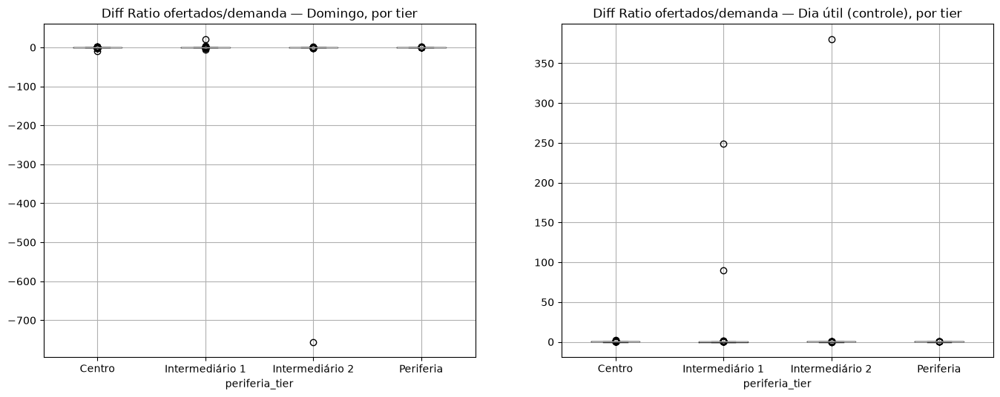

                 Diff_Ratio_domingo  Diff_Ratio_util
periferia_tier                                      
Centro                        0.017            0.050
Intermediário 1               0.008            0.037
Intermediário 2               0.024            0.041
Periferia                     0.073            0.044


In [26]:
ratio_pivot_tier = ratio_pivot.merge(linha_periferia, on="linha_blt", how="left")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
ratio_pivot_tier.boxplot(column="Diff_Ratio_domingo", by="periferia_tier", ax=axes[0])
axes[0].set_title("Diff Ratio ofertados/demanda — Domingo, por tier")
ratio_pivot_tier.boxplot(column="Diff_Ratio_util", by="periferia_tier", ax=axes[1])
axes[1].set_title("Diff Ratio ofertados/demanda — Dia útil (controle), por tier")
plt.suptitle("")
plt.savefig(DIR_IMG / "ratio_oferta_demanda_tier.png", **SALVAR_FIG)
plt.show()

ratio_oferta_demanda_tier = (
    ratio_pivot_tier.groupby("periferia_tier", observed=True)[["Diff_Ratio_domingo", "Diff_Ratio_util"]].median()
)
ratio_oferta_demanda_tier.to_parquet(DIR_TABELAS / "ratio_oferta_demanda_tier.parquet")
print(ratio_oferta_demanda_tier.round(3).to_string())

## Seção 6 — Recorte por gênero e idade

Mesma lógica de isolamento da Seção 3 (`PctDiff_domingo - PctDiff_util`, sobre média diária via
`pivot_diario`), agora por gênero e por faixa etária (60+ vs <60), usando o agregado completo da
Seção 1. `linha_blt` nulo é sempre excluído (não é embarque de ônibus municipal), assim como
`genero`/`faixa_etaria` nulos nos respectivos recortes.


In [27]:
# ~4-5% dos embarques têm genero nulo (cartão não identificado/não cadastrado) — excluídos deste
# recorte por não serem classificáveis em F/M, não porque sejam um terceiro grupo relevante.
print("Fração de N_embarques com genero nulo:", agg_demanda.filter(pl.col("genero").is_null())["N_embarques"].sum() / agg_demanda["N_embarques"].sum())

# linha_blt nula tambem e excluida aqui (politica geral: nao e embarque de onibus municipal) --
# antes essa exclusao faltava e inflava os totais em ~26-28%.
resumo_genero = dropar_bruto(pivot_diario(
    agg_demanda.filter(pl.col("genero").is_in(["F", "M"]) & pl.col("linha_blt").is_not_null()),
    ["genero"],
))
resumo_genero.to_parquet(DIR_TABELAS / "resumo_genero.parquet")
resumo_genero


Fração de N_embarques com genero nulo: 0.04353652734674928


,dia_domingo_2023,dia_sabado_2023,dia_util_2023,dia_domingo_2024,dia_sabado_2024,dia_util_2024,PctDiff_domingo,PctDiff_util,Sinal_tarifa_zero
genero,,,,,,,,,
F,1.081722e+06,2.172522e+06,3.805020e+06,1.239481e+06,2.063905e+06,3.983063e+06,14.584068,4.679160,9.904908
M,9.850997e+05,1.767431e+06,2.758576e+06,1.147171e+06,1.694458e+06,2.885110e+06,16.452264,4.586939,11.865325


In [28]:
# Checar rótulos exatos de faixa_etaria antes de definir o corte 60+ (~3-4% nulos, ver Seção 1 — dropna antes de ordenar)
faixas = agg_demanda.select("faixa_etaria").unique().to_pandas()["faixa_etaria"]
print(sorted(faixas.dropna()))

['06 a 09', '10 a 19', '20 a 29', '30 a 39', '40 a 49', '50 a 59', '60 a 64', '65 a 69', '70 a 79', '80 a 89', '90 a 99']

In [29]:
FAIXAS_60_MAIS = ["60 a 64", "65 a 69", "70 a 79", "80 a 89", "90 a 99"]  # confirmado contra os rotulos acima

# faixa_etaria nula (~3-4%) fica fora da classificacao (nem "60+" nem "<60") -- antes caia
# silenciosamente no bucket "<60", inflando esse grupo.
agg_demanda_idade = agg_demanda.with_columns(
    pl.when(pl.col("faixa_etaria").is_null()).then(None)
      .when(pl.col("faixa_etaria").is_in(FAIXAS_60_MAIS)).then(pl.lit("60+"))
      .otherwise(pl.lit("<60")).alias("grupo_idade")
)

# linha_blt nula tambem e excluida aqui (politica geral) -- antes faltava.
resumo_idade = dropar_bruto(pivot_diario(
    agg_demanda_idade.filter(pl.col("grupo_idade").is_not_null() & pl.col("linha_blt").is_not_null()),
    ["grupo_idade"],
))
resumo_idade.to_parquet(DIR_TABELAS / "resumo_idade.parquet")
resumo_idade


,dia_domingo_2023,dia_sabado_2023,dia_util_2023,dia_domingo_2024,dia_sabado_2024,dia_util_2024,PctDiff_domingo,PctDiff_util,Sinal_tarifa_zero
grupo_idade,,,,,,,,,
60+,3.374143e+05,5.749998e+05,8.882720e+05,3.400729e+05,5.898232e+05,1.008822e+06,0.787932,13.571277,-12.783345
<60,1.738869e+06,3.384825e+06,5.724232e+06,2.058248e+06,3.186387e+06,5.911179e+06,18.367048,3.265889,15.101159


### Variação espacial do sinal por gênero e por idade

`resumo_genero` e `resumo_idade` acima são os números da cidade toda — não dependem de zona e são
a leitura mais robusta, dado que qualquer corte zona × gênero × idade × tipo_dia simultâneo fica
esparso rápido. Assim como na Seção 3, usam média diária (`pivot_diario`), não soma bruta.

Abaixo o recorte espacial, agora possível no domingo: mapas do sinal por zona para F e M e para
60+ vs <60, com supressão de zonas de base pequena. Logo depois, a mesma coisa **por linha**, como
checagem de robustez — mesma lógica da Seção 3.


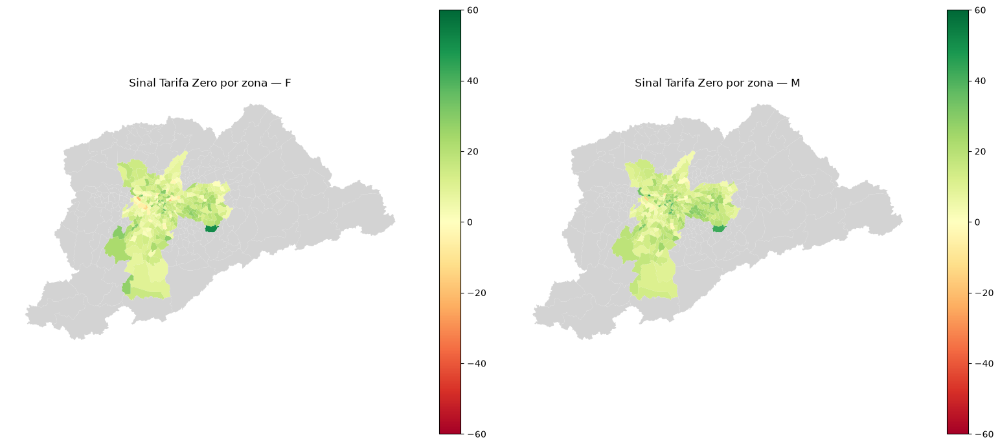

mediana do sinal por tier e genero (p.p.):
genero              F     M
periferia_tier             
Centro           12.7  15.7
Intermediário 1   9.6  13.1
Intermediário 2  14.4  15.3
Periferia         9.7  11.5


In [30]:
def sinal_por_zona(df, coluna_corte, n_min):
    # Sinal Tarifa Zero por zona, dentro de cada categoria de `coluna_corte`.
    p = pivot_diario(
        df.filter(pl.col("zona_emb").is_not_null() & pl.col("linha_blt").is_not_null()),
        ["zona_emb", coluna_corte],
    )
    p.loc[p["domingo_2023"] < n_min, "Sinal_tarifa_zero"] = np.nan
    return dropar_bruto(p).reset_index()


def mapa_por_categoria(pivot, coluna_corte, categorias, titulo, lim=60, caminho_salvar=None):
    fig, axes = plt.subplots(1, len(categorias), figsize=(8 * len(categorias), 7))
    for ax, cat in zip(np.atleast_1d(axes), categorias):
        gdf = gpd.GeoDataFrame(
            zonas.merge(pivot[pivot[coluna_corte] == cat], left_on="NumeroZona",
                        right_on="zona_emb", how="left"),
            geometry="geometry", crs=zonas.crs,
        )
        gdf.plot(column="Sinal_tarifa_zero", cmap="RdYlGn", vmin=-lim, vmax=lim, legend=True,
                 missing_kwds={"color": "lightgrey"}, ax=ax)
        ax.set_title(f"{titulo} — {cat}")
        ax.set_axis_off()
    plt.tight_layout()
    if caminho_salvar is not None:
        plt.savefig(caminho_salvar, **SALVAR_FIG)
    plt.show()


N_MIN_ZONA_CORTE = 200   # base menor que na Secao 3: o corte ja divide o volume da zona

zona_genero_pivot = sinal_por_zona(
    agg_demanda.filter(pl.col("genero").is_in(["F", "M"])), "genero", N_MIN_ZONA_CORTE)
mapa_por_categoria(zona_genero_pivot, "genero", ["F", "M"], "Sinal Tarifa Zero por zona",
                   caminho_salvar=DIR_IMG / "sinal_zona_genero.png")

sinal_tier_genero = (
    zona_genero_pivot.merge(zonas[["NumeroZona", "periferia_tier"]],
                            left_on="zona_emb", right_on="NumeroZona")
    .pivot_table(index="periferia_tier", columns="genero", values="Sinal_tarifa_zero",
                 aggfunc="median", observed=True)
)
sinal_tier_genero.to_parquet(DIR_TABELAS / "sinal_tier_genero.parquet")
print("mediana do sinal por tier e genero (p.p.):")
print(sinal_tier_genero.round(1).to_string())


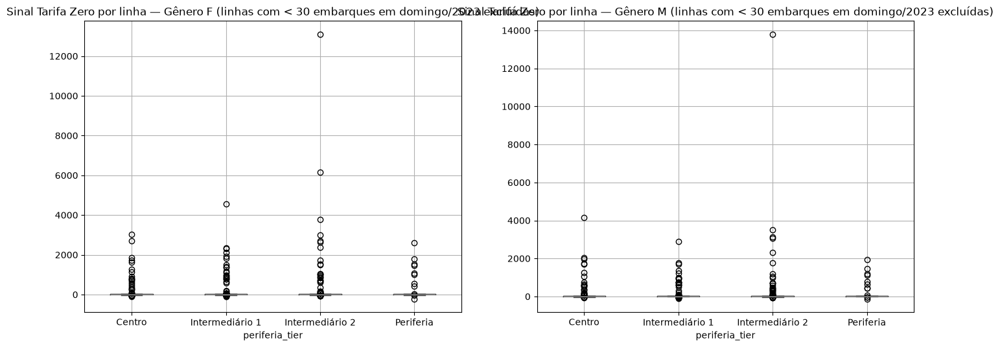

In [31]:
# Sinal Tarifa Zero por gênero, em nível de linha, estratificado por tier de periferia (proxy)
N_MIN = 30

linha_genero_pivot = pivot_diario(
    agg_demanda.filter(pl.col("genero").is_in(["F", "M"]) & pl.col("linha_blt").is_not_null()),
    ["linha_blt", "genero"],
)
linha_genero_pivot.loc[linha_genero_pivot["domingo_2023"] < N_MIN, "Sinal_tarifa_zero"] = np.nan
linha_genero_pivot = dropar_bruto(linha_genero_pivot).reset_index().merge(linha_periferia, on="linha_blt", how="left")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, genero in zip(axes, ["F", "M"]):
    linha_genero_pivot.loc[linha_genero_pivot["genero"] == genero].boxplot(
        column="Sinal_tarifa_zero", by="periferia_tier", ax=ax,
    )
    ax.set_title(f"Sinal Tarifa Zero por linha — Gênero {genero} (linhas com < {N_MIN} embarques em domingo/2023 excluídas)")
plt.suptitle("")
plt.savefig(DIR_IMG / "sinal_linha_boxplot_genero.png", **SALVAR_FIG)
plt.show()


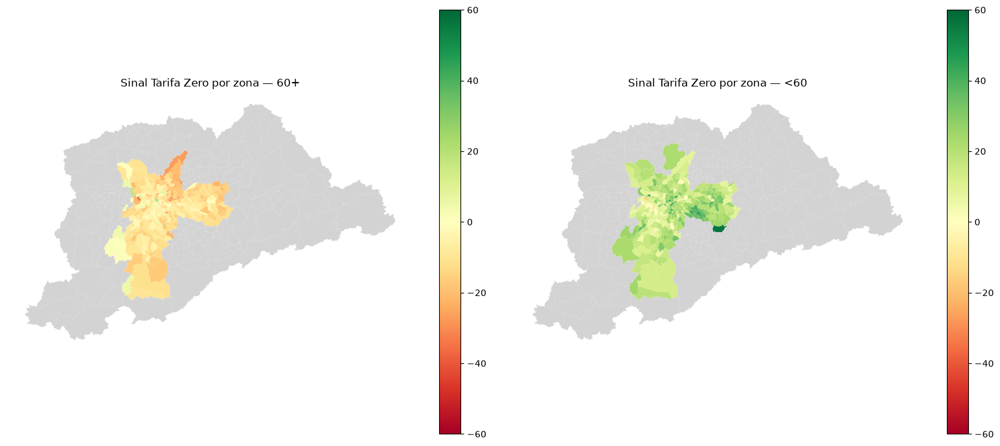

mediana do sinal por tier e grupo de idade (p.p.):
grupo_idade       60+   <60
periferia_tier             
Centro           -9.1  18.5
Intermediário 1 -10.4  16.7
Intermediário 2 -11.9  20.1
Periferia       -13.5  16.1


In [32]:
# Idade: mesmo recorte espacial, 60+ vs <60.
zona_idade_pivot = sinal_por_zona(
    agg_demanda_idade.filter(pl.col("grupo_idade").is_not_null()), "grupo_idade", N_MIN_ZONA_CORTE)
mapa_por_categoria(zona_idade_pivot, "grupo_idade", ["60+", "<60"], "Sinal Tarifa Zero por zona",
                   caminho_salvar=DIR_IMG / "sinal_zona_idade.png")

sinal_tier_idade = (
    zona_idade_pivot.merge(zonas[["NumeroZona", "periferia_tier"]],
                           left_on="zona_emb", right_on="NumeroZona")
    .pivot_table(index="periferia_tier", columns="grupo_idade", values="Sinal_tarifa_zero",
                 aggfunc="median", observed=True)
)
sinal_tier_idade.to_parquet(DIR_TABELAS / "sinal_tier_idade.parquet")
print("mediana do sinal por tier e grupo de idade (p.p.):")
print(sinal_tier_idade.round(1).to_string())


## Seção 7 — Mapas e saída

Reusa os padrões de plot de `compara_demanda.ipynb` (matplotlib `cmap="YlOrRd"` para níveis absolutos,
folium divergente para diffs/sinais). Os PNGs vão para `../docs/img/`, as tabelas de resumo para
`../outputs/03/tabelas/`, e o mapa folium desta seção para `../docs/mapa_sinal_tarifa_zero_zona.html`
— todos publicados pelo GitHub Pages.

In [33]:
print("Artefatos publicados por este notebook em docs/ e outputs/03/tabelas/:")
for p in sorted(DIR_IMG.glob("*.png")):
    print(f"  docs/img/{p.name}")
for p in sorted(DIR_TABELAS.glob("*.parquet")):
    print(f"  outputs/03/tabelas/{p.name}")
print("  docs/mapa_sinal_tarifa_zero_zona.html")

Artefatos publicados por este notebook em docs/ e outputs/03/tabelas/:
  docs/img/demanda_zona_2023_com_linhas.png
  docs/img/demanda_zona_2024.png
  docs/img/lugares_por_embarque_mensal.png
  docs/img/oferta_demanda_mensal.png
  docs/img/ratio_oferta_demanda_tier.png
  docs/img/sinal_linha_boxplot_genero.png
  docs/img/sinal_linha_boxplot_tier.png
  docs/img/sinal_zona_3paineis.png
  docs/img/sinal_zona_boxplot_tier.png
  docs/img/sinal_zona_genero.png
  docs/img/sinal_zona_idade.png
  docs/img/tiers_periferia.png
  docs/img/variacao_oferta_demanda_barras.png
  outputs/03/tabelas/heterogeneidade_frota.parquet
  outputs/03/tabelas/linhas_divergentes.parquet
  outputs/03/tabelas/niveis_mes_ano.parquet
  outputs/03/tabelas/oficial_media_dia.parquet
  outputs/03/tabelas/ratio_oferta_demanda_tier.parquet
  outputs/03/tabelas/resumo_fontes.parquet
  outputs/03/tabelas/resumo_genero.parquet
  outputs/03/tabelas/resumo_idade.parquet
  outputs/03/tabelas/robustez_zona_vs_linha.parquet
  output

## Seção 8 — Referência oficial (validação agregada)

Carrega a série oficial de passageiros transportados compilada em
`01_criacao_de_bases/03_cria_base_oficial.ipynb` (dia × linha × modalidade, todos os 731 dias de
2023-2024) e a usa **só no nível agregado**, como referência de validação e para reportar totais
de linha/cidade. **Nada aqui reescala a desagregação por zona, gênero ou faixa etária** — essas
continuam saindo da bilhetagem, nas seções acima. Nem a série oficial nem esta seção alimentam
mapa nenhum — só as tabelas publicadas em `outputs/03/tabelas/`.

Duas armadilhas de contagem que precisam ser resolvidas antes de qualquer comparação, e que
enviesam o resultado em dezenas de pontos percentuais se forem ignoradas:

1. **Cada `tipo_dia` tem o seu próprio conjunto de datas entregues.** Domingo vem da entrega de
   domingos; útil e sábado vêm da entrega de 4 meses. Usar a *união* das duas listas para os três
   tipos infla o denominador do oficial no domingo — a entrega de 4 meses tem 3 domingos de 2024
   que a Seção 1 descarta (para não duplicar com a entrega de domingos), e contá-los só do lado
   oficial derruba a razão bilhetagem/oficial para ~0,77 artificialmente.
2. **A comparação tem de ser por dia, não por mês.** A entrega não é balanceada: nos 4 meses há
   84 dias úteis de 2023 contra 66 de 2024, e 16 domingos contra 13. Somar por mês e comparar os
   totais mede o tamanho da entrega, não a demanda. `n_dias` e `pivot_diario`, calculados logo
   após a Seção 1, já aplicam essa média diária nas Seções 3 e 6; aqui reaproveitamos o mesmo
   `n_dias` via `media_por_dia`.

Fora isso, valem os três achados do `04_diagnostico_domingos_antiga_vs_nova.ipynb`:

- **Registros com `linha_blt` nulo (~25-28%) não são embarques de ônibus municipal.** Excluí-los
  é o que faz a bilhetagem bater com o oficial — e é a política geral do projeto: toda contagem
  de demanda usa a bilhetagem como base principal, sempre com `linha_blt` não nulo (`agg_demanda`
  das seções anteriores já filtra isso desde a Seção 3), inclusive na comparação com o oficial
  abaixo.
- **A razão bilhetagem/oficial escorrega entre os anos**, então a bilhetagem subestima o
  crescimento do domingo.
- Em 2024 a quebra por modalidade do oficial colapsa em `of_gratuidade` (é a Tarifa Zero); entre
  anos, só `of_total` é comparável.


In [34]:
CAMINHO_OFICIAL = "../outputs/01/Dados_Diario_Oficial_2023_2026.parquet"

# n_dias e datas_bilhetagem ja foram calculados logo apos a Secao 1 (reaproveitados por
# `pivot_diario` nas Secoes 3 e 6) -- aqui so filtramos o oficial pelas mesmas datas.
oficial = pd.read_parquet(CAMINHO_OFICIAL)
oficial = oficial[oficial["data"].isin(set(datas_bilhetagem["data"]))]

print(f"datas do oficial no recorte: {oficial['data'].nunique()} "
      f"(esperado {datas_bilhetagem['data'].nunique()})")


def media_por_dia(total_por_mes):
    # media diaria dentro do mes, depois media dos 4 meses: neutraliza a entrega desbalanceada
    return (total_por_mes / n_dias).groupby(["Ano", "tipo_dia"]).mean().unstack()


oficial_medio = media_por_dia(oficial.groupby(["Ano", "Mes", "tipo_dia"])["of_total"].sum())
print("\nOFICIAL — media de passageiros POR DIA, por tipo_dia (milhoes):")
print((oficial_medio / 1e6).round(2).to_string())
oficial_media_dia = (oficial_medio / 1e6)
oficial_media_dia.columns.name = None
oficial_media_dia.to_parquet(DIR_TABELAS / "oficial_media_dia.parquet")


datas do oficial no recorte: 210 (esperado 210)

OFICIAL — media de passageiros POR DIA, por tipo_dia (milhoes):
tipo_dia  domingo  sabado  util
Ano                            
2023         2.10    4.02  6.63
2024         2.85    4.08  7.10


In [35]:
# Sinal Tarifa Zero pela série oficial, ao lado do medido pela bilhetagem.
# Só possível agora porque a base oficial cobre dia útil, não só domingo.
def sinal_tarifa_zero(medio):
    pct = (medio.loc["2024"] / medio.loc["2023"] - 1) * 100
    return pct, pct["domingo"] - pct["util"]


def linha_resumo(fonte, medio):
    # `medio`: Ano x tipo_dia com a media de passageiros POR DIA (mesma normalizacao dos %).
    # Nomes com prefixo `dia_` de proposito -- para nao serem confundidos com os totais brutos
    # acumulados de `pivot_diario` (aqueles nunca aparecem publicados, ver `dropar_bruto`).
    pct, sinal = sinal_tarifa_zero(medio)
    return {"fonte": fonte,
            "dia_domingo_2023": medio.loc["2023", "domingo"],
            "dia_domingo_2024": medio.loc["2024", "domingo"],
            "dia_util_2023": medio.loc["2023", "util"],
            "dia_util_2024": medio.loc["2024", "util"],
            "PctDiff_domingo": pct["domingo"],
            "PctDiff_util": pct["util"],
            "Sinal_tarifa_zero": sinal}


# Bilhetagem, mesma metrica e mesma normalizacao por dia, sempre excluindo linha_blt nula --
# criterio unico de contagem do projeto, o mesmo que `pivot_diario` aplica nas Secoes 3 e 6.
bilh = agg_demanda.to_pandas().rename(columns={"Mês": "Mes"})
bilh = bilh[bilh["linha_blt"].notna()]
bilh_medio = media_por_dia(bilh.groupby(["Ano", "Mes", "tipo_dia"])["N_embarques"].sum())

resumo_fontes = pd.DataFrame([
    linha_resumo("OFICIAL", oficial_medio),
    linha_resumo("bilhetagem (sem linha_blt nula)", bilh_medio),
]).set_index("fonte")
resumo_fontes.to_parquet(DIR_TABELAS / "resumo_fontes.parquet")
print("Média de passageiros POR DIA e variação 2023->2024 (%), por fonte:")
print(resumo_fontes.round(2).to_string())
print("\nO oficial é a referência auditável; a divergência acima é a margem de incerteza")
print("sobre a MAGNITUDE do efeito — o sinal do efeito é o mesmo nas duas.")

Média de passageiros POR DIA e variação 2023->2024 (%), por fonte:
                                 dia_domingo_2023  dia_domingo_2024  dia_util_2023  dia_util_2024  PctDiff_domingo  PctDiff_util  Sinal_tarifa_zero
fonte                                                                                                                                              
OFICIAL                                2096411.91        2850093.31     6629094.18     7095220.35            35.95          7.03              28.92
bilhetagem (sem linha_blt nula)        2201727.48        2817386.75     6894976.80     7176188.83            27.96          4.08              23.88

O oficial é a referência auditável; a divergência acima é a margem de incerteza
sobre a MAGNITUDE do efeito — o sinal do efeito é o mesmo nas duas.


In [36]:
bilh_sem_nula = bilh[bilh["linha_blt"].notna()]

def media_dia_mes(df, col_valor):
    total = df.groupby(["Ano", "Mes", "tipo_dia"])[col_valor].sum()
    return (total / n_dias).unstack("tipo_dia")

oficial_dia_mes = media_dia_mes(oficial, "of_total")
bilh_dia_mes = media_dia_mes(bilh_sem_nula, "N_embarques")

MES_NOME = {"04": "Abril", "05": "Maio", "09": "Setembro", "10": "Outubro"}

linhas_niveis = []
for (ano, mes), row_of in oficial_dia_mes.iterrows():
    row_bilh = bilh_dia_mes.loc[(ano, mes)]
    linhas_niveis.append({
        "mes_ano": f"{ano}-{mes} ({MES_NOME[mes]})",
        "oficial_domingo": row_of["domingo"],
        "bilhetagem_domingo": row_bilh["domingo"],
        "delta_domingo_pct": (row_bilh["domingo"] - row_of["domingo"]) / row_of["domingo"] * 100,
        "oficial_util": row_of["util"],
        "bilhetagem_util": row_bilh["util"],
        "delta_util_pct": (row_bilh["util"] - row_of["util"]) / row_of["util"] * 100,
    })

niveis_mes_ano = pd.DataFrame(linhas_niveis).set_index("mes_ano")
niveis_mes_ano.to_parquet(DIR_TABELAS / "niveis_mes_ano.parquet")
print("M\u00e9dia de passageiros por dia, oficial x bilhetagem (sem linha_blt nula), por m\u00eas-ano:")
print(niveis_mes_ano.round(1).to_string())

linhas_sinal = []
for mes in MESES:
    row = {"mes": MES_NOME[mes]}
    for fonte, tab in [("oficial", oficial_dia_mes), ("bilhetagem", bilh_dia_mes)]:
        d23, d24 = tab.loc[("2023", mes), "domingo"], tab.loc[("2024", mes), "domingo"]
        u23, u24 = tab.loc[("2023", mes), "util"], tab.loc[("2024", mes), "util"]
        pct_dom, pct_util = (d24 - d23) / d23 * 100, (u24 - u23) / u23 * 100
        row[f"{fonte}_dom_pct"] = pct_dom
        row[f"{fonte}_util_pct"] = pct_util
        row[f"{fonte}_sinal"] = pct_dom - pct_util
    linhas_sinal.append(row)

sinal_mes_ano = pd.DataFrame(linhas_sinal).set_index("mes")
sinal_mes_ano.to_parquet(DIR_TABELAS / "sinal_mes_ano.parquet")
print("\nSinal Tarifa Zero por m\u00eas (2024 vs 2023), oficial x bilhetagem sem linha nula:")
print(sinal_mes_ano.round(1).to_string())


Média de passageiros por dia, oficial x bilhetagem (sem linha_blt nula), por mês-ano:
                    oficial_domingo  bilhetagem_domingo  delta_domingo_pct  oficial_util  bilhetagem_util  delta_util_pct
mes_ano                                                                                                                  
2023-04 (Abril)           2188416.8           2285450.8                4.4     6464825.8        6624102.5             2.5
2023-05 (Maio)            2204018.3           2312093.3                4.9     6668170.7        6965993.0             4.5
2023-09 (Setembro)        2168379.8           2286240.2                5.4     6811862.1        7103055.0             4.3
2023-10 (Outubro)         1824832.8           1923125.6                5.4     6571518.2        6886756.6             4.8
2024-04 (Abril)           2868318.8           2738833.5               -4.5     7037113.0        7220905.2             2.6
2024-05 (Maio)            2744183.5           2785205.0     

### Validação por linha — o teste forte

A comparação acima é de totais da cidade: dois erros grandes em direções opostas se cancelam nela.
A checagem que não se deixa enganar assim é **linha a linha**: para cada `linha_blt`, o total da
bilhetagem contra o `of_total` oficial, nas mesmas datas e no mesmo recorte.

A referência não é 1,000 em cada linha — a bilhetagem conta validações e o oficial conta
passageiros transportados, e as duas contabilidades divergem em casos específicos. O que interessa
é **quanto do volume cai numa banda estreita** e se as divergências estão concentradas em poucas
linhas identificáveis ou espalhadas por toda a base (o segundo caso seria bem pior).

In [37]:
BANDA = 0.10   # +-10% em torno da paridade

ofi_linha = (oficial.groupby(["Ano", "tipo_dia", "linha_blt"], as_index=False)["of_total"].sum()
             .rename(columns={"of_total": "oficial"}))

blt_linha = (bilh[bilh["linha_blt"].notna()]
             .groupby(["Ano", "tipo_dia", "linha_blt"], as_index=False)["N_embarques"].sum()
             .rename(columns={"N_embarques": "bilhetagem"}))

par = ofi_linha.merge(blt_linha, on=["Ano", "tipo_dia", "linha_blt"], how="outer")
so_oficial = par["bilhetagem"].isna().sum()
so_bilhetagem = par["oficial"].isna().sum()
par = par.dropna(subset=["oficial", "bilhetagem"])
par = par[par["oficial"] > 0]
par["razao"] = par["bilhetagem"] / par["oficial"]

print(f"pares (Ano, tipo_dia, linha) comparaveis: {len(par):,}")
print(f"  so no oficial: {so_oficial} | so na bilhetagem: {so_bilhetagem}")

dentro = par["razao"].between(1 - BANDA, 1 + BANDA)
print(f"\nlinhas dentro de +-{BANDA:.0%}: {100 * dentro.mean():.1f}% "
      f"| volume oficial dentro da banda: {100 * par.loc[dentro, 'oficial'].sum() / par['oficial'].sum():.1f}%")

print("\ndistribuicao da razao bilhetagem/oficial, por ano x tipo_dia:")
print(par.groupby(["Ano", "tipo_dia"])["razao"]
      .describe(percentiles=[.05, .25, .5, .75, .95])[["count", "5%", "25%", "50%", "75%", "95%"]]
      .round(3).to_string())

validacao_por_linha = (
    par.groupby(["Ano", "tipo_dia"])["razao"]
    .describe(percentiles=[.05, .25, .5, .75, .95])[["count", "5%", "25%", "50%", "75%", "95%"]]
    .rename(columns={"5%": "p05", "25%": "p25", "50%": "p50", "75%": "p75", "95%": "p95"})
    .reset_index()
    .assign(rotulo=lambda d: d["Ano"].astype(str) + " " + d["tipo_dia"])
    .set_index("rotulo").drop(columns=["Ano", "tipo_dia"])
)
validacao_por_linha.to_parquet(DIR_TABELAS / "validacao_por_linha.parquet")

print("\n10 linhas mais divergentes entre as de maior volume oficial (domingo):")
dom = par[par["tipo_dia"] == "domingo"].nlargest(300, "oficial")
print(dom.assign(desvio=(dom["razao"] - 1).abs()).nlargest(10, "desvio")[
    ["Ano", "linha_blt", "oficial", "bilhetagem", "razao"]].round(3).to_string(index=False))
linhas_divergentes = (
    dom.assign(desvio=(dom["razao"] - 1).abs())
    .nlargest(10, "desvio")[["Ano", "linha_blt", "oficial", "bilhetagem", "razao"]]
    .set_index("linha_blt")
)
linhas_divergentes.to_parquet(DIR_TABELAS / "linhas_divergentes.parquet")

pares (Ano, tipo_dia, linha) comparaveis: 7,290
  so no oficial: 237 | so na bilhetagem: 5

linhas dentro de +-10%: 96.8% | volume oficial dentro da banda: 93.3%

distribuicao da razao bilhetagem/oficial, por ano x tipo_dia:
                count     5%    25%    50%    75%    95%
Ano  tipo_dia                                           
2023 domingo   1135.0  1.013  1.037  1.050  1.063  1.082
     sabado    1186.0  0.976  1.029  1.044  1.056  1.076
     util      1304.0  1.003  1.032  1.041  1.050  1.071
2024 domingo   1156.0  0.919  0.968  0.982  0.999  1.061
     sabado    1194.0  0.938  0.953  0.969  1.000  1.041
     util      1315.0  1.000  1.008  1.011  1.015  1.047

10 linhas mais divergentes entre as de maior volume oficial (domingo):
 Ano linha_blt  oficial  bilhetagem  razao
2023   209P-10  85448.0    124131.0  1.453
2023   8700-10 125884.0    179370.0  1.425
2024   209P-10  91780.0    127006.0  1.384
2023   5110-10  72097.0     98155.0  1.361
2024   8700-10 144970.0    19599